In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

data, metadata = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/4.0.0.incompleteEQ5LBQ/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


In [ ]:
# Imprimir metadatos para su revisión
metadata

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.0',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir=PosixGPath('/tmp/tmpkuryawlftfds'),
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=689.64 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=8>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
   

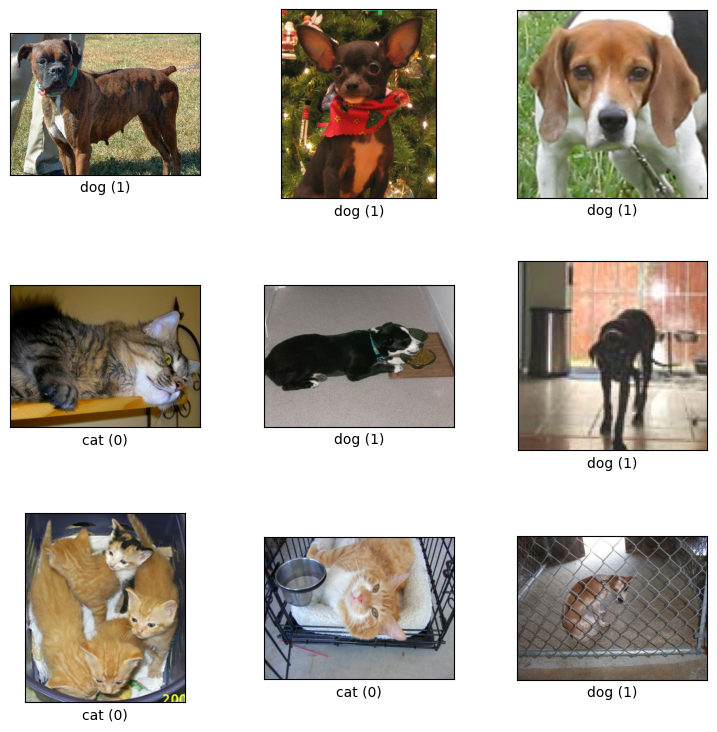

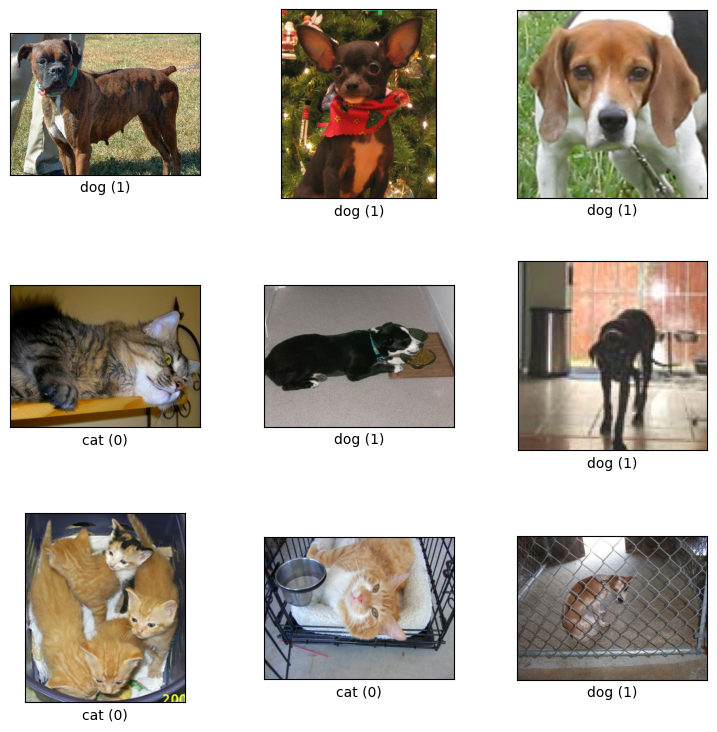

In [ ]:
# Visualizar algunos ejemplos del dataset
tfds.show_examples(data['train'], metadata)

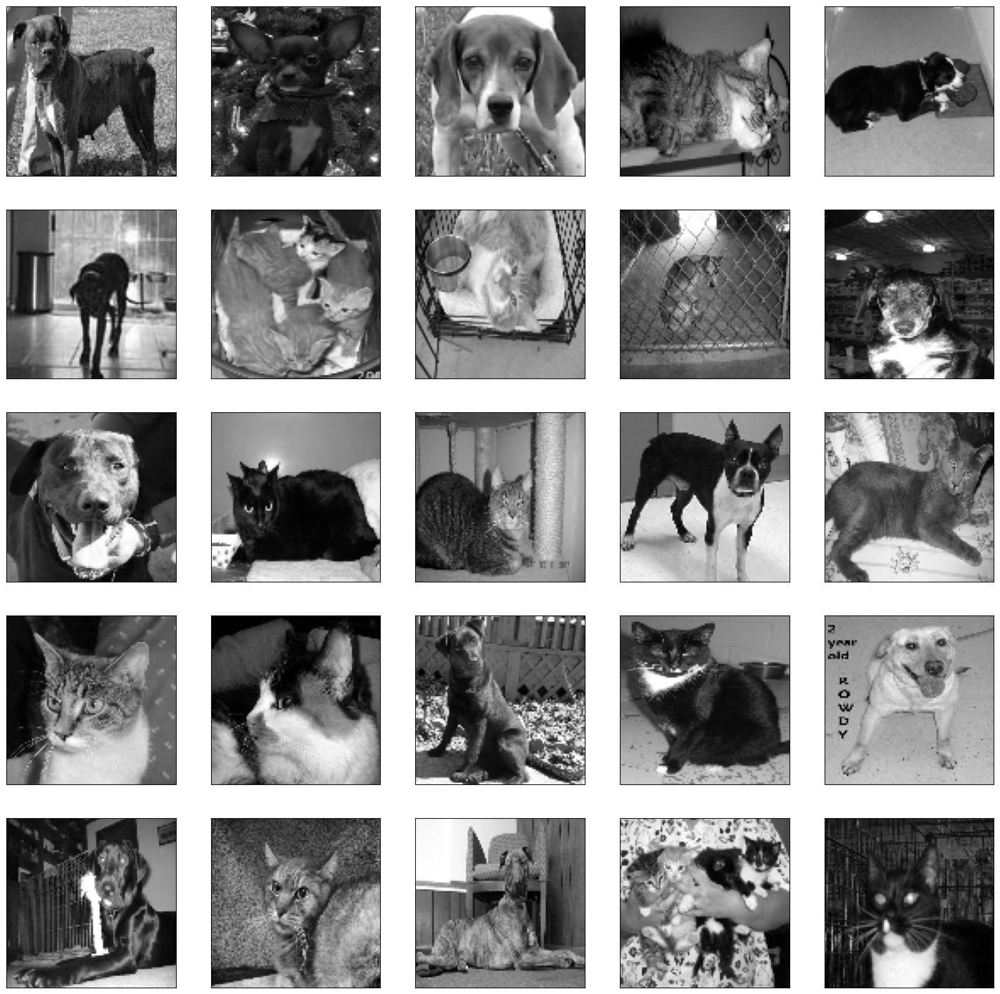

In [ ]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20,20))

img_size = 100

for i, (image, label) in enumerate(data['train'].take(25)):
  image = cv2.resize(image.numpy(), (img_size, img_size))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(image, cmap='gray')

In [ ]:
# Variable que almacenará los pares imagen-etiqueta
training_data = []

In [ ]:
for i, (image, label) in enumerate(data['train']):
  image = cv2.resize(image.numpy(), (img_size, img_size))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  image = image.reshape(img_size, img_size, 1)
  training_data.append([image, label])

In [ ]:
# Visualizar datos del primer índice
training_data[0]

[array([[[242],
         [190],
         [105],
         ...,
         [189],
         [195],
         [143]],
 
        [[230],
         [130],
         [ 88],
         ...,
         [188],
         [179],
         [187]],
 
        [[170],
         [ 93],
         [ 84],
         ...,
         [131],
         [158],
         [168]],
 
        ...,
 
        [[112],
         [173],
         [164],
         ...,
         [141],
         [152],
         [119]],
 
        [[140],
         [151],
         [172],
         ...,
         [ 96],
         [150],
         [152]],
 
        [[ 92],
         [112],
         [168],
         ...,
         [ 44],
         [ 52],
         [ 47]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [ ]:
# Visualizar la longitud del array de datos de entrenamiento
len(training_data)

23262

In [ ]:
# Definir arrays para almacenar entradas (x) y etiquetas (y)
x = []  # imagenes de entrada (píxeles)
y = []  # etiquetas asociadas (perro, gato)

for image, label in training_data:
  x.append(image)
  y.append(label)

In [ ]:
x

array([[[[0.94901961],
         [0.74509804],
         [0.41176471],
         ...,
         [0.74117647],
         [0.76470588],
         [0.56078431]],

        [[0.90196078],
         [0.50980392],
         [0.34509804],
         ...,
         [0.7372549 ],
         [0.70196078],
         [0.73333333]],

        [[0.66666667],
         [0.36470588],
         [0.32941176],
         ...,
         [0.51372549],
         [0.61960784],
         [0.65882353]],

        ...,

        [[0.43921569],
         [0.67843137],
         [0.64313725],
         ...,
         [0.55294118],
         [0.59607843],
         [0.46666667]],

        [[0.54901961],
         [0.59215686],
         [0.6745098 ],
         ...,
         [0.37647059],
         [0.58823529],
         [0.59607843]],

        [[0.36078431],
         [0.43921569],
         [0.65882353],
         ...,
         [0.17254902],
         [0.20392157],
         [0.18431373]]],


       [[[0.57254902],
         [0.45098039],
         [0.36

In [ ]:
# Aplicar normalización a los valores de los píxeles (x)
import numpy as np
x = np.array(x).astype(float)/255
y = np.array(y)
x.shape

(23262, 100, 100, 1)

In [ ]:
import tensorflow as tf
denseModel = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100,100,1)),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

CNNModel = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

CNNModel2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
# Compilación de los modelos establecidos
denseModel.compile(optimizer='adam',
                   loss='binary_crossentropy',
                   metrics=['accuracy'])
CNNModel.compile(optimizer='adam',
                   loss='binary_crossentropy',
                   metrics=['accuracy'])
CNNModel2.compile(optimizer='adam',
                   loss='binary_crossentropy',
                   metrics=['accuracy'])

In [ ]:
from keras.callbacks import TensorBoard
tensorBoardDense = TensorBoard(log_dir='logs/dense')
denseModel.fit(x, y, batch_size = 32,
               validation_split = 0.15,
               epochs = 100,
               callbacks=[tensorBoardDense])

Epoch 1/100
618/618 [==============================] - 9s 7ms/step - loss: 0.7119 - accuracy: 0.5541 - val_loss: 0.6760 - val_accuracy: 0.5765
Epoch 2/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6783 - accuracy: 0.5743 - val_loss: 0.6873 - val_accuracy: 0.5619
Epoch 3/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6743 - accuracy: 0.5824 - val_loss: 0.7075 - val_accuracy: 0.5123
Epoch 4/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6706 - accuracy: 0.5907 - val_loss: 0.6882 - val_accuracy: 0.5516
Epoch 5/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6679 - accuracy: 0.5957 - val_loss: 0.6827 - val_accuracy: 0.5705
Epoch 6/100
618/618 [==============================] - 3s 6ms/step - loss: 0.6657 - accuracy: 0.5989 - val_loss: 0.6675 - val_accuracy: 0.5831
Epoch 7/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6617 - accuracy: 0.6036 - val_loss: 0.6773 - val_accuracy: 0.5788

In [ ]:
tensorBoardCNN = TensorBoard(log_dir='logs/cnn')
CNNModel.fit(x, y, batch_size = 32,
               validation_split = 0.15,
               epochs = 100,
               callbacks=[tensorBoardCNN])

Epoch 1/100
618/618 [==============================] - 15s 15ms/step - loss: 0.5979 - accuracy: 0.6653 - val_loss: 0.5068 - val_accuracy: 0.7519
Epoch 2/100
618/618 [==============================] - 8s 13ms/step - loss: 0.4728 - accuracy: 0.7762 - val_loss: 0.4565 - val_accuracy: 0.7874
Epoch 3/100
618/618 [==============================] - 8s 13ms/step - loss: 0.4054 - accuracy: 0.8134 - val_loss: 0.4080 - val_accuracy: 0.8155
Epoch 4/100
618/618 [==============================] - 8s 12ms/step - loss: 0.3486 - accuracy: 0.8455 - val_loss: 0.4022 - val_accuracy: 0.8229
Epoch 5/100
618/618 [==============================] - 8s 13ms/step - loss: 0.2921 - accuracy: 0.8766 - val_loss: 0.3683 - val_accuracy: 0.8398
Epoch 6/100
618/618 [==============================] - 8s 12ms/step - loss: 0.2328 - accuracy: 0.9026 - val_loss: 0.3734 - val_accuracy: 0.8433
Epoch 7/100
618/618 [==============================] - 8s 13ms/step - loss: 0.1716 - accuracy: 0.9294 - val_loss: 0.4635 - val_accuracy

In [ ]:
tensorBoardCNN2 = TensorBoard(log_dir='logs/cnn2')
CNNModel2.fit(x, y, batch_size = 32,
               validation_split = 0.15,
               epochs = 100,
               callbacks=[tensorBoardCNN2])

Epoch 1/100
618/618 [==============================] - 14s 16ms/step - loss: 0.6122 - accuracy: 0.6568 - val_loss: 0.5274 - val_accuracy: 0.7398
Epoch 2/100
618/618 [==============================] - 10s 16ms/step - loss: 0.4952 - accuracy: 0.7604 - val_loss: 0.4505 - val_accuracy: 0.7831
Epoch 3/100
618/618 [==============================] - 10s 16ms/step - loss: 0.4437 - accuracy: 0.7925 - val_loss: 0.4080 - val_accuracy: 0.8112
Epoch 4/100
618/618 [==============================] - 10s 16ms/step - loss: 0.3985 - accuracy: 0.8219 - val_loss: 0.3901 - val_accuracy: 0.8201
Epoch 5/100
618/618 [==============================] - 11s 17ms/step - loss: 0.3575 - accuracy: 0.8400 - val_loss: 0.3628 - val_accuracy: 0.8404
Epoch 6/100
618/618 [==============================] - 10s 16ms/step - loss: 0.3208 - accuracy: 0.8593 - val_loss: 0.3581 - val_accuracy: 0.8438
Epoch 7/100
618/618 [==============================] - 9s 15ms/step - loss: 0.2914 - accuracy: 0.8744 - val_loss: 0.3731 - val_acc

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 23757), started 0:02:34 ago. (Use '!kill 23757' to kill it.)

<IPython.core.display.Javascript object>

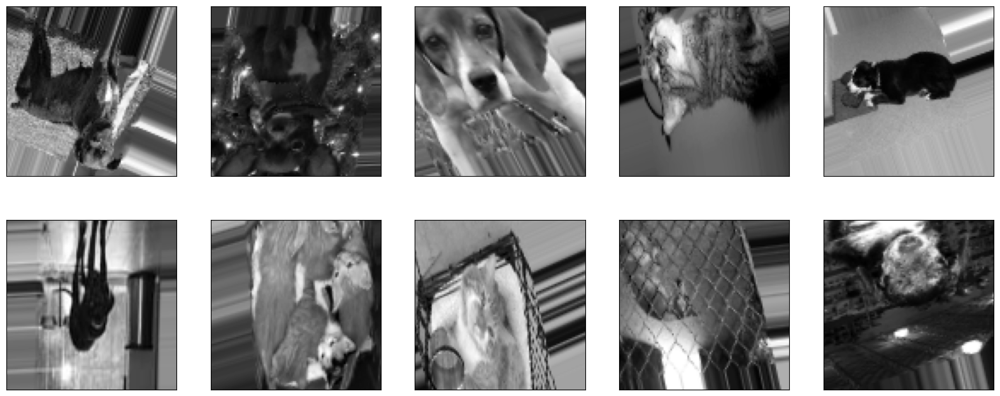

In [ ]:
# Importar el generador con aumento de datos
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range = 30,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 15,
    zoom_range = [0.7, 1.4],
    horizontal_flip = True,
    vertical_flip = True
)

datagen.fit(x)
plt.figure(figsize=(20,8))
for image, label in datagen.flow(x, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image[i].reshape(100,100), cmap='gray')
  break


In [ ]:
import gc
gc.collect()

39537

In [ ]:
# Modelos con Aumento de Datos
import tensorflow as tf
denseModel_DA = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100,100,1)),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

CNNModel_DA = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

CNNModel2_DA = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
# Compilación de los modelos establecidos
denseModel_DA.compile(optimizer='adam',
                   loss='binary_crossentropy',
                   metrics=['accuracy'])
CNNModel_DA.compile(optimizer='adam',
                   loss='binary_crossentropy',
                   metrics=['accuracy'])
CNNModel2_DA.compile(optimizer='adam',
                   loss='binary_crossentropy',
                   metrics=['accuracy'])

In [ ]:
len(x) * .85 # 19700
len(x) - 19700 # 3562

x_training = x[:19700]
x_validation = x[19700:]

y_training = y[:19700]
y_validation = y[19700:]

In [ ]:
data_gen_training = datagen.flow(x_training, y_training, batch_size = 32)

In [ ]:
tensorBoardDense_DA = TensorBoard(log_dir='logs/dense_DA')
denseModel_DA.fit(data_gen_training, epochs=100, batch_size=32,
                  validation_data=(x_validation, y_validation),
                  steps_per_epoch=int(np.ceil(len(x_training)/float(32))),
                  validation_steps=int(np.ceil(len(x_validation)/float(32))),
                  callbacks=[tensorBoardDense_DA])

Epoch 1/100
616/616 [==============================] - 34s 54ms/step - loss: 0.6932 - accuracy: 0.4965 - val_loss: 0.6931 - val_accuracy: 0.5020
Epoch 2/100
616/616 [==============================] - 26s 42ms/step - loss: 0.6932 - accuracy: 0.4959 - val_loss: 0.6931 - val_accuracy: 0.5020
Epoch 3/100
616/616 [==============================] - 24s 39ms/step - loss: 0.6932 - accuracy: 0.4994 - val_loss: 0.6931 - val_accuracy: 0.4980
Epoch 4/100
616/616 [==============================] - 24s 38ms/step - loss: 0.6932 - accuracy: 0.4947 - val_loss: 0.6931 - val_accuracy: 0.5020
Epoch 5/100
616/616 [==============================] - 25s 40ms/step - loss: 0.6932 - accuracy: 0.5022 - val_loss: 0.6932 - val_accuracy: 0.4980
Epoch 6/100
616/616 [==============================] - 24s 38ms/step - loss: 0.6932 - accuracy: 0.4966 - val_loss: 0.6931 - val_accuracy: 0.5020
Epoch 7/100
616/616 [==============================] - 24s 40ms/step - loss: 0.6932 - accuracy: 0.5017 - val_loss: 0.6932 - val_ac

In [ ]:
tensorBoardCNN_DA = TensorBoard(log_dir='logs/cnn_DA')
CNNModel_DA.fit(data_gen_training, epochs=100, batch_size=32,
                  validation_data=(x_validation, y_validation),
                  steps_per_epoch=int(np.ceil(len(x_training)/float(32))),
                  validation_steps=int(np.ceil(len(x_validation)/float(32))),
                  callbacks=[tensorBoardCNN_DA])

Epoch 1/100
616/616 [==============================] - 31s 48ms/step - loss: 0.6807 - accuracy: 0.5640 - val_loss: 0.6722 - val_accuracy: 0.5921
Epoch 2/100
616/616 [==============================] - 29s 46ms/step - loss: 0.6633 - accuracy: 0.6004 - val_loss: 0.6502 - val_accuracy: 0.6246
Epoch 3/100
616/616 [==============================] - 28s 45ms/step - loss: 0.6506 - accuracy: 0.6208 - val_loss: 0.6351 - val_accuracy: 0.6404
Epoch 4/100
616/616 [==============================] - 26s 43ms/step - loss: 0.6335 - accuracy: 0.6443 - val_loss: 0.6186 - val_accuracy: 0.6710
Epoch 5/100
616/616 [==============================] - 27s 43ms/step - loss: 0.6187 - accuracy: 0.6581 - val_loss: 0.5925 - val_accuracy: 0.6800
Epoch 6/100
616/616 [==============================] - 28s 45ms/step - loss: 0.6045 - accuracy: 0.6745 - val_loss: 0.5784 - val_accuracy: 0.6982
Epoch 7/100
616/616 [==============================] - 28s 45ms/step - loss: 0.5920 - accuracy: 0.6843 - val_loss: 0.5780 - val_ac

In [ ]:
# Exportar modelo CNN con aumento de datos
CNNModel_DA.save('cat-vs-dog-cnn-da.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
!pip install tensorflowjs

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 45.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 104.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 54.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 98.3 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.14.0
    Uninstalling tensorflow-estimator-2.14.0:
      Successfully uninstalled tensorflow-estimator-2.14.0
  Attempting uninstall: keras
    Found existing installation: keras 2.14.0
    Uninstalling keras-2.14.0:
      Successfully uninstalled keras-2.14.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.14.1
    Uninstalling tensorboard-2.14.1:
      Successfully uninstall

In [ ]:
!mkdir output_folder

In [ ]:
!tensorflowjs_converter --input_format keras cat-vs-dog-cnn-da.h5 output_folder

2023-12-03 04:48:52.133356: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-03 04:48:52.133412: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-03 04:48:52.134802: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-03 04:48:53.190431: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
